<div class="alert alert-info">
    <h1 align="left">Image Classification (Cats vs Dogs) </h1>
    <h3 align="left">Mohadeseh Jahanabadi</h3>
</div>

## Dataset Description

The train folder contains 25,000 images of dogs and cats. Each image in this folder has the label as part of the filename. The test folder contains 12,500 images, named according to a numeric id. For each image in the test set, you should predict a probability that the image is a dog

(1 = dog, 0 = cat).

<a href='https://www.kaggle.com/competitions/dogs-vs-cats-redux-kernels-edition/data'>https://www.kaggle.com/competitions/dogs-vs-cats-redux-kernels-edition/overview</a>

## Libraries

In [ ]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

import math
import time
import cv2
import os
import glob
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from PIL import Image
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score,recall_score,f1_score

import torch
import torch.nn as nn
import torch.optim as optim

import torchvision
import torchvision.datasets as datasets
import torchvision.models as models
import torchvision.transforms as transforms


# some initial setup
np.set_printoptions(precision=2)
use_gpu = torch.cuda.is_available()
np.random.seed(1234)

In [ ]:
use_gpu

True

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


## Data

- train: learning the **parameters** of the model.
- valid: learning **hyper-parameters**.
- test
- development

In [ ]:
!unzip gdrive/My\ Drive/Datasets/train.zip

Streaming output truncated to the last 5000 lines.
  inflating: train/train/dog/dog.10464.jpg  
  inflating: train/train/dog/dog.2422.jpg  
  inflating: train/train/dog/dog.4053.jpg  
  inflating: train/train/dog/dog.8669.jpg  
  inflating: train/train/dog/dog.12273.jpg  
  inflating: train/train/dog/dog.9577.jpg  
  inflating: train/train/dog/dog.6644.jpg  
  inflating: train/train/dog/dog.12298.jpg  
  inflating: train/train/dog/dog.8682.jpg  
  inflating: train/train/dog/dog.6877.jpg  
  inflating: train/train/dog/dog.11791.jpg  
  inflating: train/train/dog/dog.11949.jpg  
  inflating: train/train/dog/dog.4906.jpg  
  inflating: train/train/dog/dog.4912.jpg  
  inflating: train/train/dog/dog.11785.jpg  
  inflating: train/train/dog/dog.9588.jpg  
  inflating: train/train/dog/dog.8696.jpg  
  inflating: train/train/dog/dog.6863.jpg  
  inflating: train/train/dog/dog.4084.jpg  
  inflating: train/train/dog/dog.3933.jpg  
  inflating: train/train/dog/dog.11975.jpg  
  inflating: train

In [ ]:
!unzip gdrive/My\ Drive/Datasets/Test.zip

Streaming output truncated to the last 5000 lines.
  inflating: Test/Dog/1949.jpg       
  inflating: Test/Dog/5291.jpg       
  inflating: Test/Dog/3838.jpg       
  inflating: Test/Dog/3810.jpg       
  inflating: Test/Dog/10085.jpg      
  inflating: Test/Dog/8789.jpg       
  inflating: Test/Dog/9497.jpg       
  inflating: Test/Dog/1544.jpg       
  inflating: Test/Dog/7135.jpg       
  inflating: Test/Dog/3435.jpg       
  inflating: Test/Dog/7653.jpg       
  inflating: Test/Dog/8560.jpg       
  inflating: Test/Dog/1222.jpg       
  inflating: Test/Dog/7647.jpg       
  inflating: Test/Dog/1236.jpg       
  inflating: Test/Dog/3421.jpg       
  inflating: Test/Dog/11600.jpg      
  inflating: Test/Dog/2059.jpg       
  inflating: Test/Dog/7121.jpg       
  inflating: Test/Dog/8212.jpg       
  inflating: Test/Dog/11628.jpg      
  inflating: Test/Dog/4400.jpg       
  inflating: Test/Dog/2071.jpg       
  inflating: Test/Dog/6217.jpg       
  inflating: Test/Dog/12321.jpg      

In [ ]:
Train_Data = '/content/train/'
Test_Data = '/content/Test'

batch_size = 32
image_size = 224

In [ ]:
os.listdir(Train_Data)

['valid', '.DS_Store', 'train']

In [ ]:
trn_dir = f'{Train_Data}train'
val_dir = f'{Train_Data}valid'

In [ ]:
os.listdir(trn_dir)

['cat', 'dog', '.DS_Store']

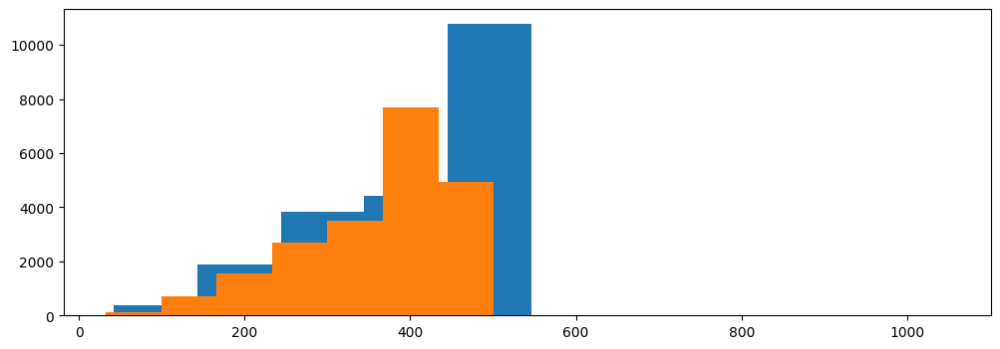

In [ ]:
fnames = glob.glob(f'{trn_dir}/*/*.jpg')
sizes = [Image.open(f).size for f in fnames]

hs, ws = list(zip(*sizes))

plt.figure(figsize=(12., 4.))
plt.hist(hs)
plt.hist(ws);

### Datasets and Dataloaders in PyTorch

- <h6>Dataset</h6>A set of images.
- <h6>Dataloader</h6>Loads data from dataset behind the scene.

#### Transformations

Dataloader object uses these tranformations when loading data.

In [ ]:
tfms = transforms.Compose([
    transforms.Resize((image_size, image_size)),  # PIL Image
    transforms.ToTensor(),        # Tensor
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

#### Dataset

In [ ]:
train_ds = datasets.ImageFolder(trn_dir, transform=tfms)
valid_ds = datasets.ImageFolder(val_dir, transform=tfms)

#### Dataloaders

In [ ]:
train_dl = torch.utils.data.DataLoader(train_ds,
                                       batch_size=batch_size,
                                       shuffle=True,
                                       num_workers=8)

valid_dl = torch.utils.data.DataLoader(valid_ds,
                                       batch_size=batch_size,
                                       shuffle=False,
                                       num_workers=8)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


<h6>imshow:</h6>a function to show random images.

In [ ]:
def imshow(inp, title=None):
    """Imshow for Tensor.
    """
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std  = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    plt.axis('off')
    if title is not None:
        plt.title(title)

#### Show random images from training data

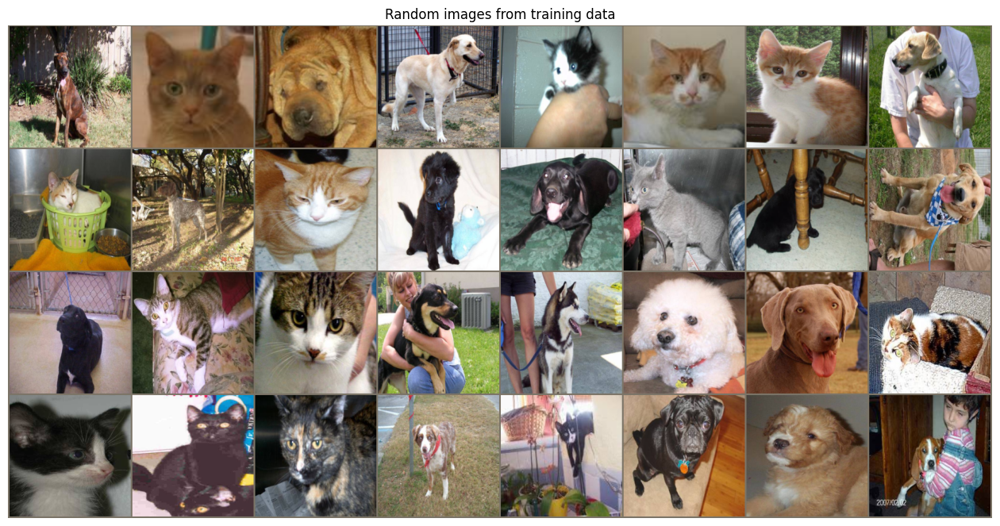

In [ ]:
inputs, targets = next(iter(train_dl))
out = torchvision.utils.make_grid(inputs, padding=3)
plt.figure(figsize=(16, 12))
imshow(out, title='Random images from training data')


# Model: CNN , Loss Function: Cross Entropy , Optimizer: SGD

## Model: CNN

In [ ]:
class SimpleCNN(nn.Module):

    def __init__(self):
        super(SimpleCNN, self).__init__()

        self.conv1 = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=5, padding=2),
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.MaxPool2d(2)
        )

        self.conv2 = nn.Sequential(
            nn.Conv2d(16, 32, kernel_size=5, padding=2),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(2)
        )

        self.fc = nn.Linear(56 * 56 * 32, 2)

    def forward(self, x):
        out = self.conv1(x)
        out = self.conv2(out)            # (bs, C, H,  W)
        out = out.view(out.size(0), -1)  # (bs, C * H, W)
        out = self.fc(out)
        return out

### transfer model to GPU, if gpu is available

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [ ]:
model = SimpleCNN()
model = model.to(device)

### Loss function and optimizer

### Cross Entropy
- Measuring distance between two distributions.

- From score, compute probabilities using `softmax` function.
- Compute loss for each data using the computed probilities and its true label.

$$L_i=-\log(p_{y_i})$$

- Compute the total loss as the average over all the data losses plus regularization loss.

$$L = \frac{1}{N} \sum_{i=1}^N{L_i} + \lambda \sum_{jk}W_{jk}^2$$

<img src="http://www.snrazavi.ir/imgs/cross_entropy_formula.jpg" width="80%"/>

### Gradient Descent Algorithm

<img src="http://www.snrazavi.ir/imgs/gradient_descent_line_graph.gif" width="100%"/>

In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.002, momentum=0.9)

## Train

In [ ]:
num_epochs = 10
losses = []
epochs = []

for epoch in range(num_epochs):
    epoch_loss = 0.0  # Define a variable to calculate the average loss in each epoch
    for i, (inputs, targets) in enumerate(train_dl):
        inputs = inputs.to(device)
        targets = targets.to(device)

        # forward pass
        outputs = model(inputs)

        # loss
        loss = criterion(outputs, targets)
        epoch_loss += loss.item()  # Add the loss to the epoch's average loss

        # backward pass
        optimizer.zero_grad()
        loss.backward()

        # update parameters
        optimizer.step()

        # report
        if (i + 1) % 50 == 0:
            print('Epoch [%2d/%2d], Step [%3d/%3d], Loss: %.4f'
                  % (epoch + 1, num_epochs, i + 1, len(train_dl), loss.item()))

    epochs.append(epoch + 1)

    losses.append(epoch_loss / len(train_dl))

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Epoch [ 1/10], Step [ 50/665], Loss: 1.6779
Epoch [ 1/10], Step [100/665], Loss: 0.5373
Epoch [ 1/10], Step [150/665], Loss: 0.7798
Epoch [ 1/10], Step [200/665], Loss: 0.7161
Epoch [ 1/10], Step [250/665], Loss: 0.7080
Epoch [ 1/10], Step [300/665], Loss: 0.6216
Epoch [ 1/10], Step [350/665], Loss: 0.5622
Epoch [ 1/10], Step [400/665], Loss: 0.7265
Epoch [ 1/10], Step [450/665], Loss: 0.6906
Epoch [ 1/10], Step [500/665], Loss: 0.6657
Epoch [ 1/10], Step [550/665], Loss: 0.5912
Epoch [ 1/10], Step [600/665], Loss: 0.7273
Epoch [ 1/10], Step [650/665], Loss: 0.6391
Epoch [ 2/10], Step [ 50/665], Loss: 0.4113
Epoch [ 2/10], Step [100/665], Loss: 0.6644
Epoch [ 2/10], Step [150/665], Loss: 0.6187
Epoch [ 2/10], Step [200/665], Loss: 0.5857
Epoch [ 2/10], Step [250/665], Loss: 0.6087
Epoch [ 2/10], Step [300/665], Loss: 0.5158
Epoch [ 2/10], Step [350/665], Loss: 0.5192
Epoch [ 2/10], Step [400/665], Loss: 0.5887
Epoch [ 2/10], Step [450/665], Loss: 0.5667
Epoch [ 2/10], Step [500/665], L

### Loss Chart

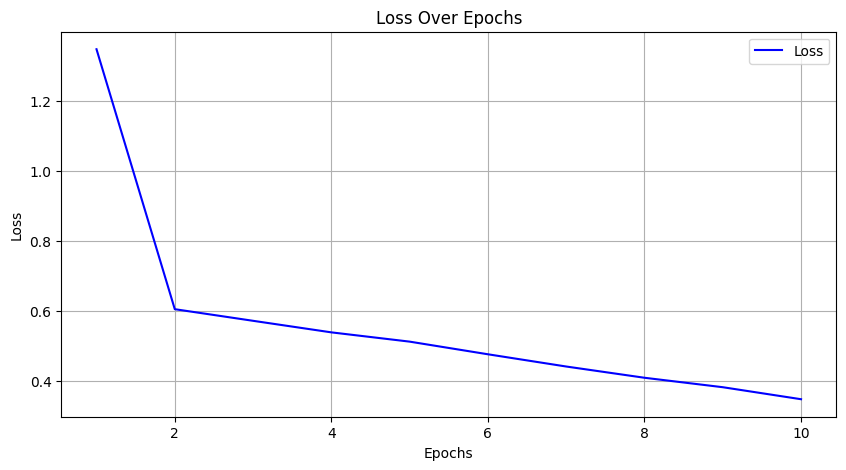

In [ ]:
# Loss plot
plt.figure(figsize=(10, 5))
plt.plot(epochs, losses, label='Loss', color='blue')   # Number of epochs on the horizontal axis
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Over Epochs')
plt.legend()
plt.grid(True)
plt.show()

## Analyze results

### Accuracy

#### Evaluate Model Function

In [ ]:
def evaluate_model(model, dataloader, device):
    model.eval()  # for batch normalization layers
    corrects = 0

    with torch.no_grad():
        for inputs, targets in dataloader:
            inputs, targets = inputs.to(device), targets.to(device)
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            corrects += (preds == targets.data).sum()

    acc = 100. * corrects / len(dataloader.dataset)
    return acc

In [ ]:
validation_accuracy = evaluate_model(model, valid_dl, device)
train_accuracy = evaluate_model(model, train_dl, device)

print(f'validation acc: {validation_accuracy:.2f}\ntrain acc: {train_accuracy:.2f}')

validation acc: 75.36
train acc: 87.63


### Model Visualization

#### Visualize Model Function

In [ ]:
def visualize_model(model, dataloader, device, num_images=6):
    """ Visulaize the prediction of the model on a bunch of random data.
    """
    model.eval()
    images_so_far = 0
    fig = plt.figure(figsize=(10., 8.))

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloader):
            inputs, labels = inputs.to(device), labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs.data, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title('predicted: {}'.format(dataloader.dataset.classes[preds[j]]))
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    return

#### Model Visualization for Training Data

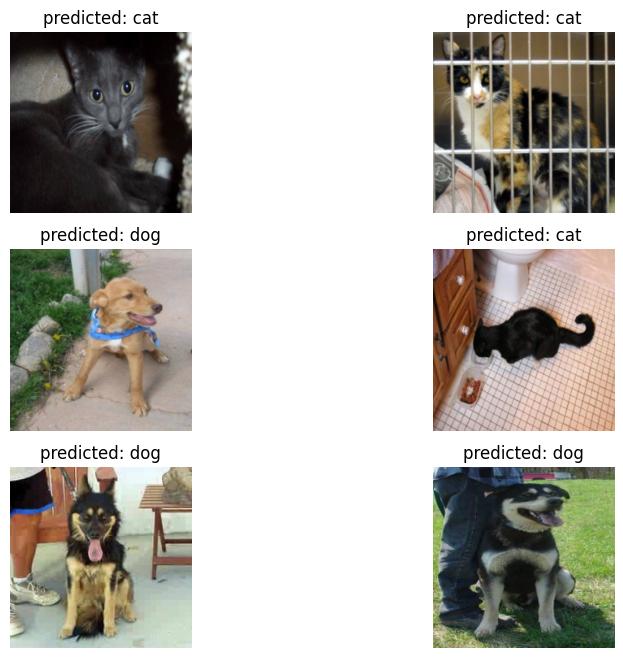

In [ ]:
visualize_model(model, train_dl, device)

#### Model Visualization for Validation Data

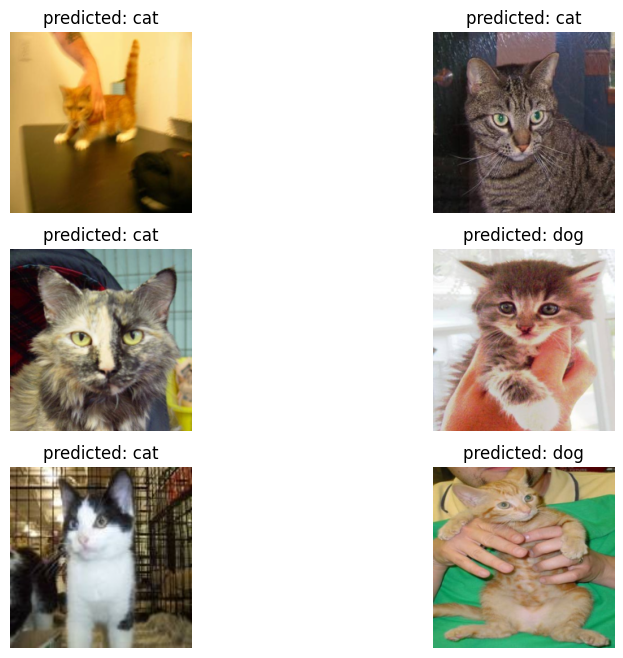

In [ ]:
visualize_model(model, valid_dl, device)

### Error Plot

#### Plot Errors Function

In [ ]:
def plot_errors(model, dataloader, device):
    model.eval()
    plt.figure(figsize=(12, 24))
    count = 0

    with torch.no_grad():
        for inputs, labels in tqdm(dataloader):
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            incorrect_idxs = np.flatnonzero(preds.cpu().numpy() != labels.cpu().numpy())

            for idx in incorrect_idxs:
                count += 1
                if count > 30: break
                ax = plt.subplot(10, 3, count)
                ax.axis('off')
                ax.set_title('predicted: {}'.format(dataloader.dataset.classes[preds[idx]]))
                imshow(inputs.cpu().data[idx])

    plt.show()

    print("{} images out of {} were misclassified.".format(count, len(dataloader.dataset)))

#### Error Plot for Validation Data

100%|██████████| 118/118 [00:16<00:00,  6.97it/s]


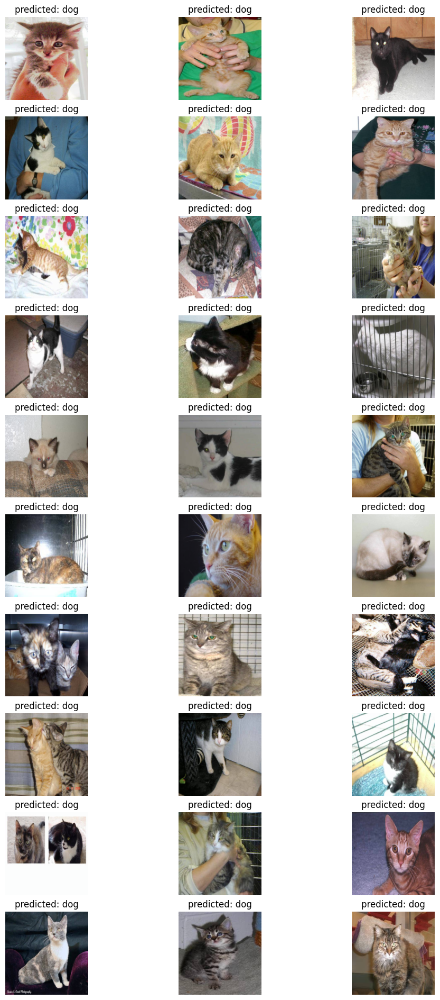

145 images out of 3750 were misclassified.


In [ ]:
plot_errors(model, valid_dl, device)

### Confusion matrix

#### Prediction Class

In [ ]:
def predict_class(model, dataloader, device):
    """ Predict probabilities for the given model and dataset
    """
    model.eval()
    result = []
    y = []

    with torch.no_grad():
        for inputs, targets in tqdm(dataloader):
            inputs = inputs.to(device)
            scores = model(inputs)
            _, preds = torch.max(scores, 1)
            result += [preds.cpu().numpy()]
            y += [targets.cpu().numpy()]

    result = np.concatenate(result)
    y = np.concatenate(y)
    return result, y

#### Plot Confusion Matrix Function

In [ ]:
import itertools
def plot_confusion_matrix(cm, classes, normalize=False, figsize=(12, 12), title='Confusion matrix', cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    (This function is copied from the scikit docs.)
    """
    plt.figure(figsize=figsize)
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize: cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    print(cm)
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        annot = "%.2f" % cm[i, j] if cm[i, j] > 0 else ""
        plt.text(j, i, annot, horizontalalignment="center", color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

100%|██████████| 118/118 [00:15<00:00,  7.83it/s]


[[0.72 0.28]
 [0.21 0.79]]


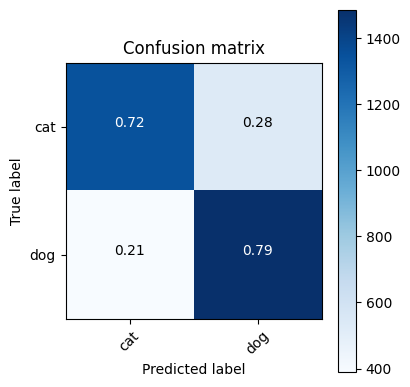

In [ ]:
y_pred, y_true = predict_class(model, valid_dl, device)
cm = confusion_matrix(y_true, y_pred)
plot_confusion_matrix(cm, train_ds.classes, normalize=True, figsize=(4, 4))

# Overfit

<div>
    <strong>What is OVERFIT? </strong>
    <ul>
        <li>The most important concept in ML!</li>
        <li>Simply, it means that your model is too complex for your problem.</li>
    </ul>
</div>

<h4>What we can do about it?</h4>

- Regularization
- Dropout
- Data Augmentation
- Transfer Learning

#Possible Transformations:

- Scaling - Rotation - Translation - Flip horizontaly - Random Crop - Color jitter - many more!

### Transformations

In [ ]:
train_transform = transforms.Compose([
    transforms.Resize((image_size, image_size)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(20),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

valid_transform = transforms.Compose([
    transforms.Resize((image_size, image_size)),  # PIL Image
    transforms.ToTensor(),        # Tensor
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_ds = datasets.ImageFolder(trn_dir, transform=train_transform)
valid_ds = datasets.ImageFolder(val_dir, transform=valid_transform)

### Dataloaders

In [ ]:
train_dl = torch.utils.data.DataLoader(train_ds,
                                       batch_size=batch_size,
                                       shuffle=True,
                                       num_workers=8)

valid_dl = torch.utils.data.DataLoader(valid_ds,
                                       batch_size=batch_size,
                                       shuffle=False,
                                       num_workers=8)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


# Model: resnet18



### Model: Resnet18

In [ ]:
#Determining the number of classes
num_classes = len(train_ds.classes)

#Using the Resnet18 model
model = models.resnet18(pretrained=True)
num_ftrs = model.fc.in_features

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 197MB/s]


### Add dropout

In [ ]:
model.fc = nn.Sequential(
    nn.Dropout(0.5),  # Dropout 50%
    nn.Linear(num_ftrs, num_classes)
)

#### transfer model to GPU, if gpu is available

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = model.to(device)

## Loss function and optimizer(Cross Entropy, SGD)

- Loss Function: Cross Entropy
- Optimizer: SGD
- using sheduler

In [ ]:
from torch.optim.lr_scheduler import ReduceLROnPlateau

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(model.parameters(), lr=0.002)

scheduler = ReduceLROnPlateau(optimizer, 'min', patience=3, factor=0.5, verbose=True)

### Train

In [ ]:
losses = []
epochs = []
def train_model(model, criterion, optimizer, num_epochs):
    corrects = 0
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0

        for inputs, labels in train_dl:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()

        epoch_loss = running_loss / len(train_dl)
        trn_acc = evaluate_model(model, train_dl, device)
        print(f"Epoch {epoch+1}/{num_epochs}\ntrain Loss: {epoch_loss:.4f}, train acc: {trn_acc:.4f}")

        losses.append(epoch_loss)
        epochs.append(epoch + 1)

        # Model evaluation on validation data
        val_loss = validate_model(model, criterion)
        val_acc = evaluate_model(model, valid_dl, device)
        print(f"Validation Loss: {val_loss:.4f}, Validation Acc: {val_acc:.4f}")

       # Learning rate reduction by scheduler
        scheduler.step(val_loss)

true_labels = []  # For storing true labels
predictions = []  # For storing predictions


# Model validation step
def validate_model(model, criterion):
    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():
        for inputs, labels in valid_dl:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            val_loss += loss.item()

            _, predicted = torch.max(outputs, 1)

            # Appending true labels and predictions to the lists
            true_labels.extend(labels.cpu().numpy())
            predictions.extend(predicted.cpu().numpy())

    val_loss /= len(valid_dl)
    return val_loss

###Model Training

In [ ]:
train_model(model, criterion, optimizer, num_epochs=15)
print("Finished Training")

Epoch 1/15
train Loss: 0.1994, train acc: 96.5788
Validation Loss: 0.0629, Validation Acc: 97.4933
Epoch 2/15
train Loss: 0.1058, train acc: 97.9435
Validation Loss: 0.0407, Validation Acc: 98.4533
Epoch 3/15
train Loss: 0.0890, train acc: 96.4518
Validation Loss: 0.0582, Validation Acc: 97.4400
Epoch 4/15
train Loss: 0.0809, train acc: 98.4000
Validation Loss: 0.0338, Validation Acc: 98.7733
Epoch 5/15
train Loss: 0.0726, train acc: 98.3718
Validation Loss: 0.0347, Validation Acc: 98.4533
Epoch 6/15
train Loss: 0.0614, train acc: 98.7012
Validation Loss: 0.0298, Validation Acc: 98.9600
Epoch 7/15
train Loss: 0.0603, train acc: 98.8706
Validation Loss: 0.0280, Validation Acc: 98.8533
Epoch 8/15
train Loss: 0.0553, train acc: 98.6494
Validation Loss: 0.0306, Validation Acc: 98.7200
Epoch 9/15
train Loss: 0.0512, train acc: 98.8235
Validation Loss: 0.0289, Validation Acc: 98.8533
Epoch 10/15
train Loss: 0.0557, train acc: 98.7624
Validation Loss: 0.0313, Validation Acc: 98.8533
Epoch 11/

#### Loss Chart

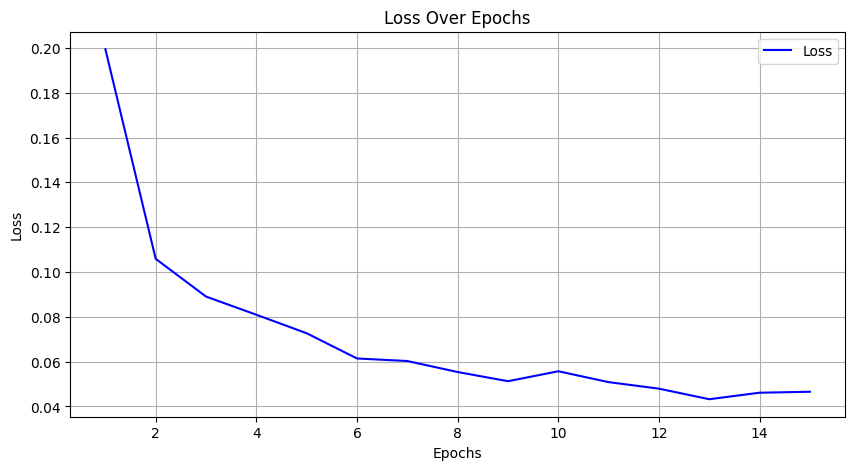

In [ ]:
plt.figure(figsize=(10, 5))
plt.plot(epochs, losses, label='Loss', color='blue')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Over Epochs')
plt.legend()
plt.grid(True)
plt.show()

 Save the trained model

In [ ]:
torch.save(model.state_dict(), 'resnet18_model_CS.pth')

### Analyze results

#### Accuracy

In [ ]:
validation_accuracy = evaluate_model(model, valid_dl, device)
train_accuracy = evaluate_model(model, train_dl, device)

print(f'validation acc: {validation_accuracy:.2f}\ntrain acc: {train_accuracy:.2f}')

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


validation acc: 98.88
train acc: 99.15


In [ ]:
precision = precision_score(true_labels, predictions, average='weighted')
print(f'Precision: {precision:.4f}')

# Recall
recall = recall_score(true_labels, predictions, average='weighted')
print(f'Recall: {recall:.4f}')

# F1-Score
f1 = f1_score(true_labels, predictions, average='weighted')
print(f'F1-Score: {f1:.4f}')

Precision: 0.9864
Recall: 0.9864
F1-Score: 0.9864


#### Model Visualization

##### Model Visualization for Training Data

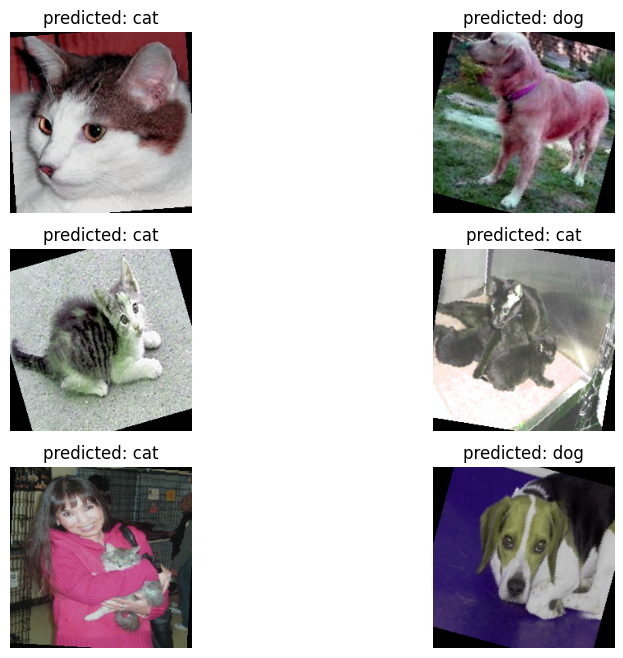

In [ ]:
visualize_model(model, train_dl, device)

##### Model Visualization for Validation Data

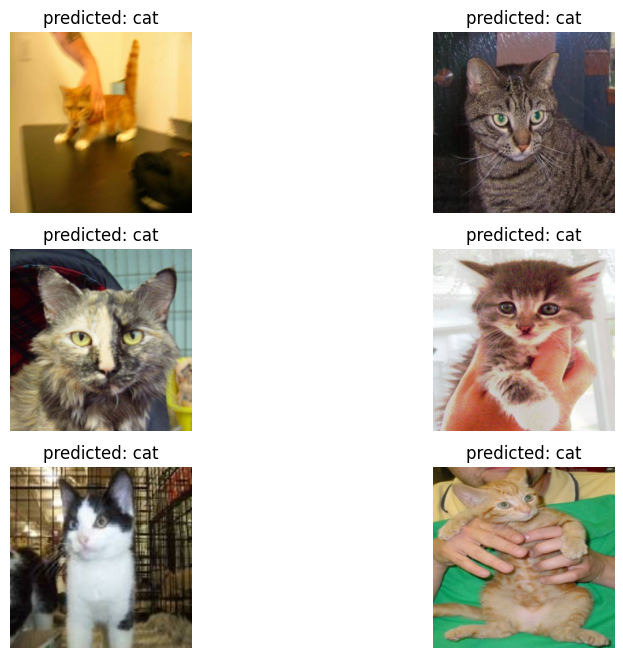

In [ ]:
visualize_model(model, valid_dl, device)

#### Errors Plot

##### Error Plot for Validation Data

100%|██████████| 118/118 [00:19<00:00,  6.05it/s]


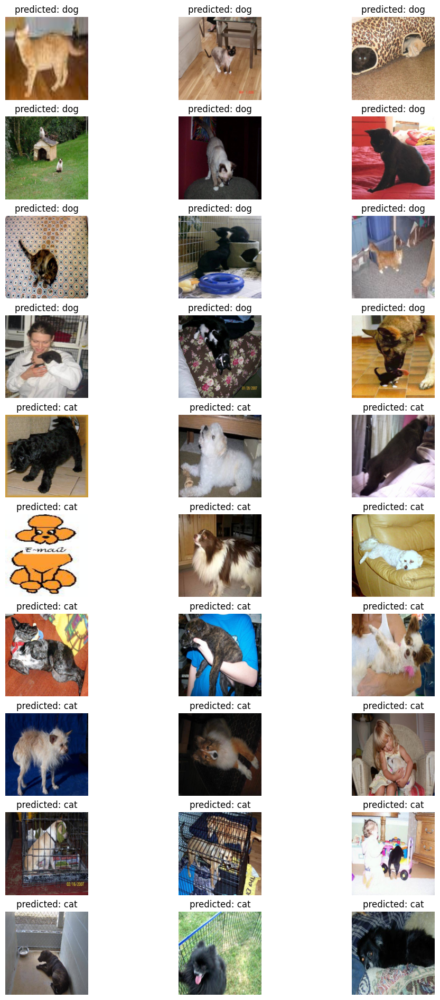

41 images out of 3750 were misclassified.


In [ ]:
plot_errors(model, valid_dl, device)

### Confusion matrix

100%|██████████| 118/118 [00:15<00:00,  7.54it/s]


[[0.99 0.01]
 [0.02 0.98]]


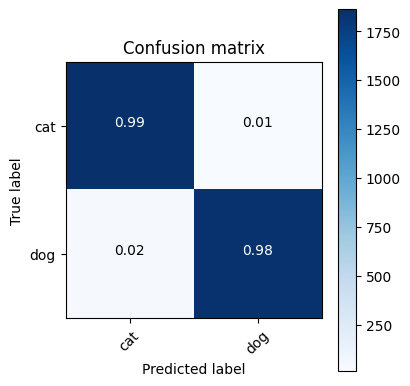

In [ ]:
y_pred, y_true = predict_class(model, valid_dl, device)
cm = confusion_matrix(y_true, y_pred)
plot_confusion_matrix(cm, train_ds.classes, normalize=True, figsize=(4, 4))

## Loss function and optimizer(Cross Entropy, RMSprop)

- Loss Function: Cross Entropy
- Optimizer: Adam
- using sheduler

In [ ]:
from torch.optim.lr_scheduler import ReduceLROnPlateau

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.RMSprop(model.parameters(), lr=0.002)

scheduler = ReduceLROnPlateau(optimizer, 'min', patience=3, factor=0.5, verbose=True)

### Model training

In [ ]:
train_model(model, criterion, optimizer, num_epochs=15)
print("Finished Training")

Epoch 1/15
train Loss: 0.6898, train acc: 55.6094
Validation Loss: 2.2323, Validation Acc: 54.7467
Epoch 2/15
train Loss: 0.6345, train acc: 62.6259
Validation Loss: 1.6232, Validation Acc: 60.1600
Epoch 3/15
train Loss: 0.5245, train acc: 76.9035
Validation Loss: 0.4294, Validation Acc: 79.3600
Epoch 4/15
train Loss: 0.4422, train acc: 59.7929
Validation Loss: 0.7149, Validation Acc: 59.3333
Epoch 5/15
train Loss: 0.3668, train acc: 64.8141
Validation Loss: 0.6297, Validation Acc: 68.0000
Epoch 6/15
train Loss: 0.3027, train acc: 72.9741
Validation Loss: 0.5689, Validation Acc: 75.0933
Epoch 7/15
train Loss: 0.2599, train acc: 84.9318
Validation Loss: 0.2916, Validation Acc: 89.0133
Epoch 8/15
train Loss: 0.2270, train acc: 85.0118
Validation Loss: 0.2612, Validation Acc: 87.6533
Epoch 9/15
train Loss: 0.2060, train acc: 93.2753
Validation Loss: 0.1470, Validation Acc: 94.1867
Epoch 10/15
train Loss: 0.1885, train acc: 92.7341
Validation Loss: 0.1662, Validation Acc: 93.6267
Epoch 11/

 Save the trained model

In [ ]:
# Save the trained model
torch.save(model.state_dict(), 'resnet18_model_CR.pth')

#### Loss Chart

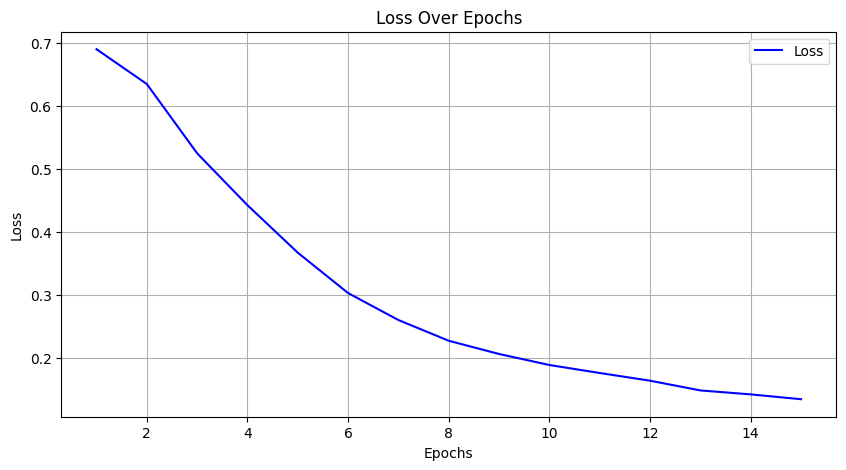

In [ ]:
plt.figure(figsize=(10, 5))
plt.plot(epochs, losses, label='Loss', color='blue')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Over Epochs')
plt.legend()
plt.grid(True)
plt.show()

### Analyze results

#### Accuracy

In [ ]:
validation_accuracy = evaluate_model(model, valid_dl, device)
train_accuracy = evaluate_model(model, train_dl, device)

print(f'validation acc: {validation_accuracy:.2f}\ntrain acc: {train_accuracy:.2f}')

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


validation acc: 91.63
train acc: 90.72


In [ ]:
precision = precision_score(true_labels, predictions, average='weighted')
print(f'Precision: {precision:.4f}')

# Recall
recall = recall_score(true_labels, predictions, average='weighted')
print(f'Recall: {recall:.4f}')

# F1-Score
f1 = f1_score(true_labels, predictions, average='weighted')
print(f'F1-Score: {f1:.4f}')

Precision: 0.8190
Recall: 0.8178
F1-Score: 0.8177


#### Model Visualization

##### Model Visualization for Training Data

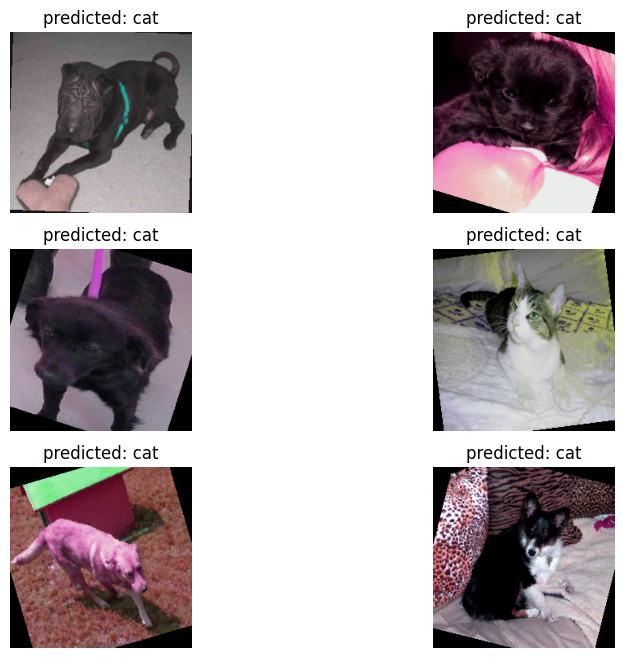

In [ ]:
visualize_model(model, train_dl, device)

##### Model Visualization for Validation Data

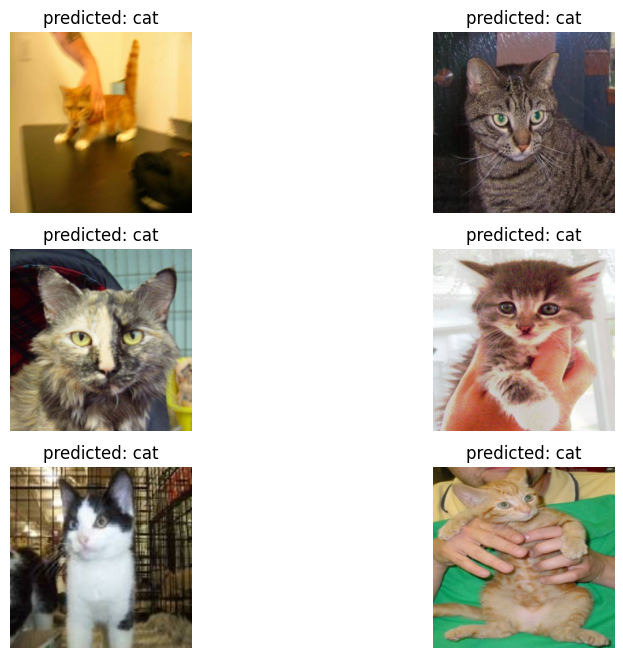

In [ ]:
visualize_model(model, valid_dl, device)

#### Errors Plot

##### Error Plot for Validation Data

In [ ]:
plot_errors(model, valid_dl, device)

Output hidden; open in https://colab.research.google.com to view.

### Confusion matrix

100%|██████████| 118/118 [00:15<00:00,  7.69it/s]


[[0.98 0.02]
 [0.15 0.85]]


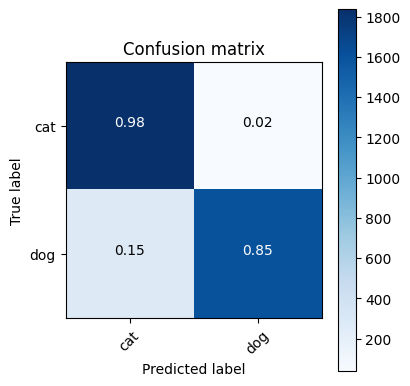

In [ ]:
y_pred, y_true = predict_class(model, valid_dl, device)
cm = confusion_matrix(y_true, y_pred)
plot_confusion_matrix(cm, train_ds.classes, normalize=True, figsize=(4, 4))

## Loss function and optimizer(Cross Entropy, Adam)

- Loss Function: Cross Entropy
- Optimizer: Adam
- using sheduler

In [ ]:
from torch.optim.lr_scheduler import ReduceLROnPlateau

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)

scheduler = ReduceLROnPlateau(optimizer, 'min', patience=3, factor=0.5, verbose=True)

### Model Training

In [ ]:
# آموزش مدل
train_model(model, criterion, optimizer, num_epochs=20)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Epoch 1/20
train Loss: 0.0984, train acc: 98.3106
Validation Loss: 0.0414, Validation Acc: 98.5067
Epoch 2/20
train Loss: 0.0655, train acc: 98.7624
Validation Loss: 0.0335, Validation Acc: 98.7733
Epoch 3/20
train Loss: 0.0440, train acc: 98.9082
Validation Loss: 0.0482, Validation Acc: 98.2667
Epoch 4/20
train Loss: 0.0411, train acc: 99.1718
Validation Loss: 0.0415, Validation Acc: 98.4267
Epoch 5/20
train Loss: 0.0360, train acc: 99.1482
Validation Loss: 0.0304, Validation Acc: 98.8533
Epoch 6/20
train Loss: 0.0490, train acc: 99.3459
Validation Loss: 0.0400, Validation Acc: 98.5600
Epoch 7/20
train Loss: 0.0391, train acc: 99.3224
Validation Loss: 0.0346, Validation Acc: 98.6667
Epoch 8/20
train Loss: 0.0373, train acc: 99.4635
Validation Loss: 0.0321, Validation Acc: 98.7200
Epoch 9/20
train Loss: 0.0245, train acc: 99.2659
Validation Loss: 0.0386, Validation Acc: 98.7733
Epoch 00009: reducing learning rate of group 0 to 5.0000e-05.
Epoch 10/20
train Loss: 0.0165, train acc: 99.7

Save the trained model

In [ ]:
torch.save(model.state_dict(), 'resnet18_model_CA.pth')

#### Loss Chart

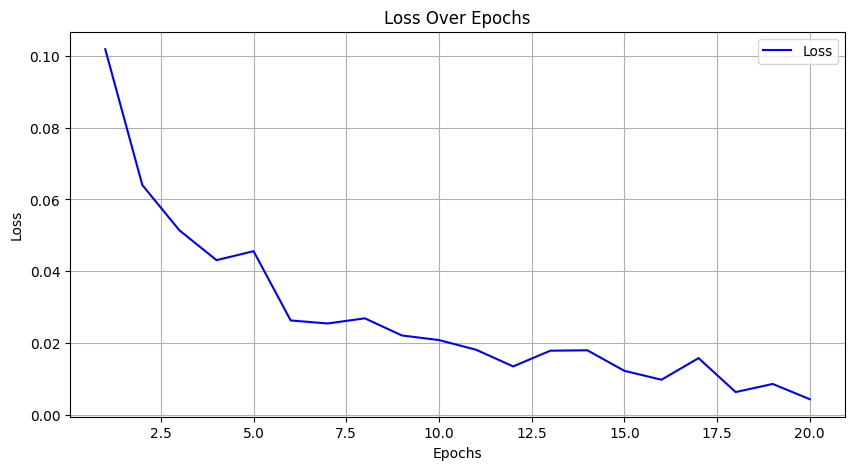

In [ ]:
plt.figure(figsize=(10, 5))
plt.plot(epochs, losses, label='Loss', color='blue')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Over Epochs')
plt.legend()
plt.grid(True)
plt.show()

### Analyze results

#### Accuracy

In [ ]:
validation_accuracy = evaluate_model(model, valid_dl, device)
train_accuracy = evaluate_model(model, train_dl, device)

print(f'validation acc: {validation_accuracy:.2f}\ntrain acc: {train_accuracy:.2f}')

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


validation acc: 99.20
train acc: 99.91


In [ ]:
precision = precision_score(true_labels, predictions, average='weighted')
print(f'Precision: {precision:.4f}')

# Recall
recall = recall_score(true_labels, predictions, average='weighted')
print(f'Recall: {recall:.4f}')

# F1-Score
f1 = f1_score(true_labels, predictions, average='weighted')
print(f'F1-Score: {f1:.4f}')

Precision: 0.9891
Recall: 0.9891
F1-Score: 0.9891


#### Model Visualization

##### Model Visualization for Training Data

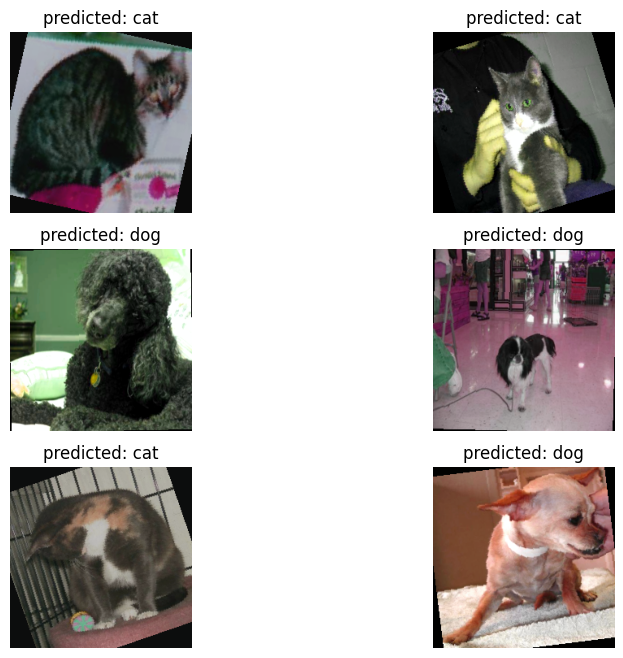

In [ ]:
visualize_model(model, train_dl, device)

##### Model Visualization for Validation Data

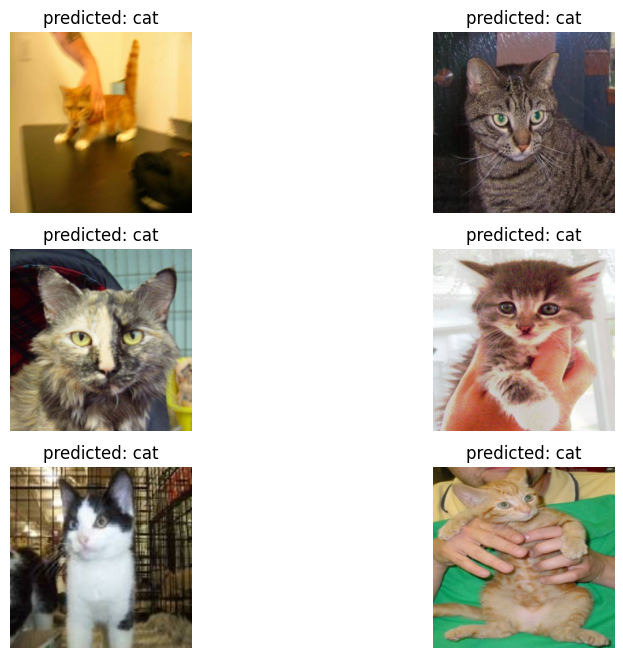

In [ ]:
visualize_model(model, valid_dl, device)

#### Errors Plot

##### Error Plot for Validation Data

100%|██████████| 118/118 [00:18<00:00,  6.48it/s]


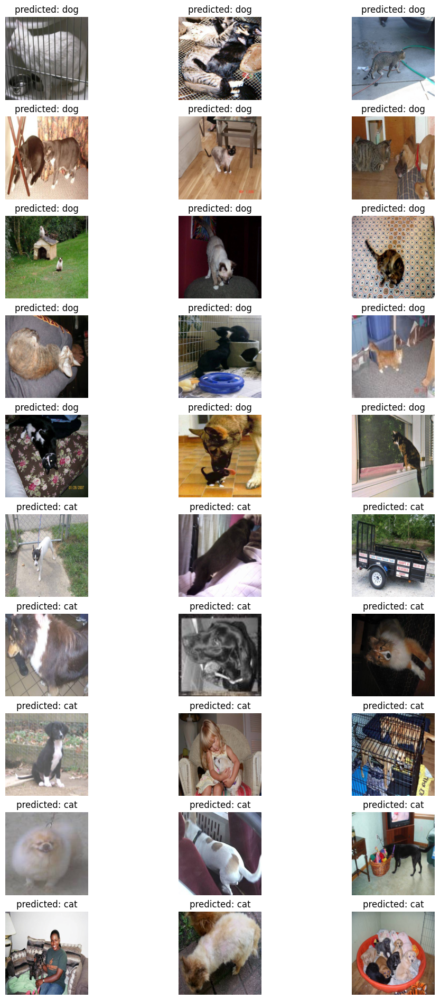

30 images out of 3750 were misclassified.


In [ ]:
plot_errors(model, valid_dl, device)

### Confusion matrix

100%|██████████| 118/118 [00:20<00:00,  5.62it/s]


[[0.99 0.01]
 [0.01 0.99]]


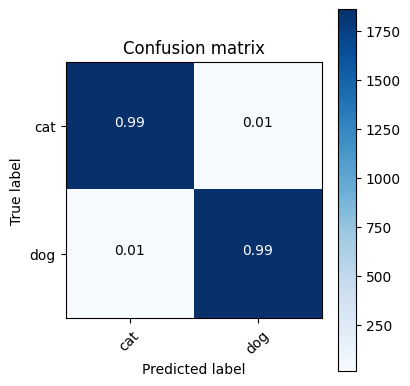

In [ ]:
y_pred, y_true = predict_class(model, valid_dl, device)
cm = confusion_matrix(y_true, y_pred)
plot_confusion_matrix(cm, train_ds.classes, normalize=True, figsize=(4, 4))

# Test

Load the trained model

In [ ]:
model.load_state_dict(torch.load('resnet18_model_CA.pth'))
model.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

### Test Data Transformation

In [ ]:
test_transform = transforms.Compose([
    transforms.Resize((image_size, image_size)),  # PIL Image
    transforms.ToTensor(),        # Tensor
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

test_ds = datasets.ImageFolder(Test_Data, transform=test_transform)

test_dl = torch.utils.data.DataLoader(test_ds, batch_size=batch_size, shuffle=False, num_workers=8)

## Test the model on the test data

### Function to test the model on test data

In [ ]:
def test_model(model):
    model.eval()
    test_loss = 0.0
    correct = 0
    total = 0
    with torch.no_grad():
        for inputs, labels in test_dl:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    test_acc = correct / total
    return test_acc

### Model testing & Accuracy

In [ ]:
test_accuracy = test_model(model)
print(f"Test Accuracy: {test_accuracy:.4f}")

Test Accuracy: 0.9869


## Errors Plot

### Error Plot for Validation Data

  0%|          | 0/391 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
100%|██████████| 391/391 [00:58<00:00,  6.70it/s]


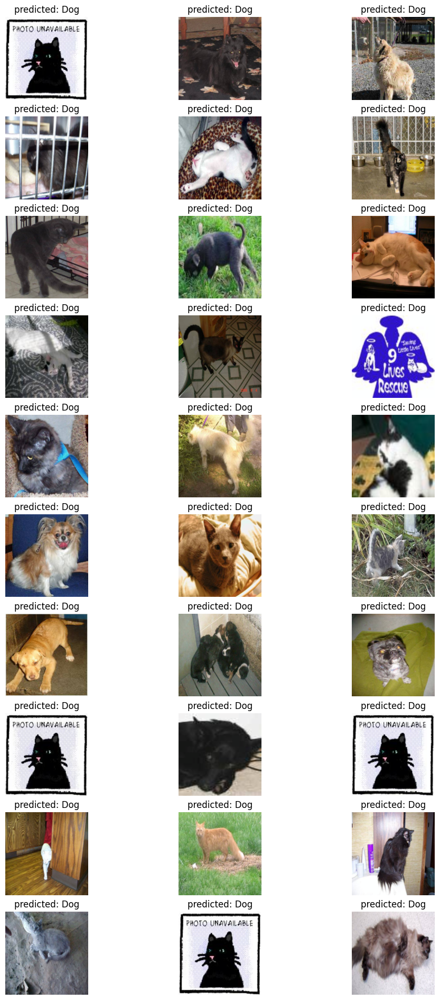

133 images out of 12496 were misclassified.


In [ ]:
plot_errors(model, test_dl, device)

## Confusion matrix

  0%|          | 0/391 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
100%|██████████| 391/391 [00:54<00:00,  7.22it/s]


[[0.99 0.01]
 [0.02 0.98]]


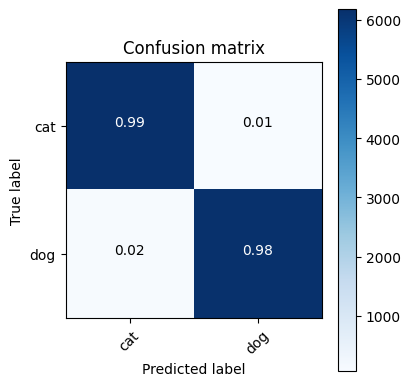

In [ ]:
y_pred, y_true = predict_class(model, test_dl, device)
cm = confusion_matrix(y_true, y_pred)
plot_confusion_matrix(cm, train_ds.classes, normalize=True, figsize=(4, 4))